<a href="https://www.kaggle.com/code/longpham1702/image-classification-acc-98?scriptVersionId=154813710" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/indian-birds/Birds_25/valid/Common-Rosefinch/Common-Rosefinch_814.jpg
/kaggle/input/indian-birds/Birds_25/valid/Common-Rosefinch/Common-Rosefinch_650.jpg
/kaggle/input/indian-birds/Birds_25/valid/Common-Rosefinch/Common-Rosefinch_946.jpg
/kaggle/input/indian-birds/Birds_25/valid/Common-Rosefinch/Common-Rosefinch_64.jpg
/kaggle/input/indian-birds/Birds_25/valid/Common-Rosefinch/Common-Rosefinch_1137.jpg
/kaggle/input/indian-birds/Birds_25/valid/Common-Rosefinch/Common-Rosefinch_787.jpg
/kaggle/input/indian-birds/Birds_25/valid/Common-Rosefinch/Common-Rosefinch_1136.jpg
/kaggle/input/indian-birds/Birds_25/valid/Common-Rosefinch/Common-Rosefinch_1160.jpg
/kaggle/input/indian-birds/Birds_25/valid/Common-Rosefinch/Common-Rosefinch_1159.jpg
/kaggle/input/indian-birds/Birds_25/valid/Common-Rosefinch/Common-Rosefinch_232.jpg
/kaggle/input/indian-birds/Birds_25/valid/Common-Rosefinch/Common-Rosefinch_566.jpg
/kaggle/input/indian-birds/Birds_25/valid/Common-Rosefinch/Common-Rosefin

In [2]:
import random
import os
import glob
import time
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
import tensorflow_hub as hub
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import (classification_report, precision_recall_fscore_support,
                             accuracy_score, top_k_accuracy_score, f1_score,
                             matthews_corrcoef, confusion_matrix, ConfusionMatrixDisplay)
from scikitplot.metrics import plot_roc
from keras import layers, Sequential
from keras.utils import plot_model
import pickle

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [3]:
class CFG:
    EPOCHS = 10
    BATCH_SIZE = 32
    SEED = 42
    TF_SEED = 768
    HEIGHT = 256
    WIDTH = 256
    CHANNELS = 3
    IMAGE_SIZE = (256, 256, 3)

In [4]:
TRAIN_PATH = '/kaggle/input/indian-birds/Birds_25/train'
TEST_PATH = '/kaggle/input/indian-birds/Birds_25/valid'

In [5]:
train_images = glob.glob(TRAIN_PATH + '/**/*.jpg', recursive=True)
test_images = glob.glob(TEST_PATH + '/**/*.jpg', recursive = True)

In [6]:
train_size = len(train_images)
test_size = len(test_images)

total = train_size + test_size

print(f'train samples count:\t\t{train_size}')
print(f'test samples count:\t\t{test_size}')
print('=======================================')
print(f'TOTAL:\t\t\t\t{total}')

train samples count:		30000
test samples count:		7500
TOTAL:				37500


In [7]:
def generate_labels(image_paths):
    return [(_.split('/')[-2:][0]).replace('-', '_') for _ in image_paths]


def build_df(image_paths, labels):
    df = pd.DataFrame({
        'image_path': image_paths,
        'label': generate_labels(labels)
    })

    return df.sample(frac=1, random_state=CFG.SEED).reset_index(drop=True)

In [8]:
train_df = build_df(train_images, generate_labels(train_images))
test_df = build_df(test_images, generate_labels(test_images))

In [9]:
label_encoder = LabelEncoder()

train_df['label_encoded'] = label_encoder.fit_transform(train_df.label)
test_df['label_encoded'] = label_encoder.transform(test_df.label)

train_df.head(10)

/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtyp

,image_path,label,label_encoded
0,/kaggle/input/indian-birds/Birds_25/train/Asia...,Asian_Green_Bee_Eater,0
1,/kaggle/input/indian-birds/Birds_25/train/Whit...,White_Breasted_Kingfisher,22
2,/kaggle/input/indian-birds/Birds_25/train/Gray...,Gray_Wagtail,9
3,/kaggle/input/indian-birds/Birds_25/train/Rudd...,Ruddy_Shelduck,19
4,/kaggle/input/indian-birds/Birds_25/train/Comm...,Common_Kingfisher,3
5,/kaggle/input/indian-birds/Birds_25/train/Comm...,Common_Tailorbird,6
6,/kaggle/input/indian-birds/Birds_25/train/Whit...,White_Wagtail,24
7,/kaggle/input/indian-birds/Birds_25/train/Brow...,Brown_Headed_Barbet,1
8,/kaggle/input/indian-birds/Birds_25/train/Whit...,White_Breasted_Waterhen,23
9,/kaggle/input/indian-birds/Birds_25/train/Copp...,Coppersmith_Barbet,7


In [10]:
num_classes = len(label_encoder.classes_)
class_names = label_encoder.classes_

print(f'Number of classes: {num_classes}')
print(f'Classes: {class_names}')

Number of classes: 25
Classes: ['Asian_Green_Bee_Eater' 'Brown_Headed_Barbet' 'Cattle_Egret'
 'Common_Kingfisher' 'Common_Myna' 'Common_Rosefinch' 'Common_Tailorbird'
 'Coppersmith_Barbet' 'Forest_Wagtail' 'Gray_Wagtail' 'Hoopoe'
 'House_Crow' 'Indian_Grey_Hornbill' 'Indian_Peacock' 'Indian_Pitta'
 'Indian_Roller' 'Jungle_Babbler' 'Northern_Lapwing' 'Red_Wattled_Lapwing'
 'Ruddy_Shelduck' 'Rufous_Treepie' 'Sarus_Crane'
 'White_Breasted_Kingfisher' 'White_Breasted_Waterhen' 'White_Wagtail']


In [11]:
def _load(image_path):
    image = tf.io.read_file(image_path)
    image = tf.io.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, [CFG.HEIGHT, CFG.WIDTH],
                            method=tf.image.ResizeMethod.LANCZOS5)
    image = tf.cast(image, tf.float32)/255.
    return image

def view_sample(image, label, color_map='rgb', fig_size=(8, 10)):
    plt.figure(figsize=fig_size)
    if color_map=='rgb':
        plt.imshow(image)
    else:
        plt.imshow(tf.image.rgb_to_grayscale(image), cmap=color_map)

    plt.title(f'Label: {label}', fontsize=16)
    return

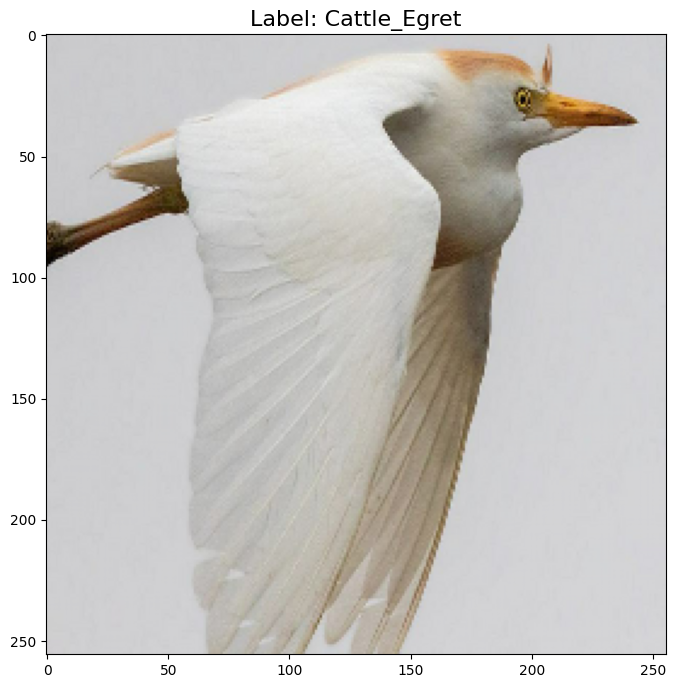

In [12]:
idx = random.sample(train_df.index.to_list(), 1)[0]

sample_image, sample_label = _load(train_df.image_path[idx]), train_df.label[idx]

view_sample(sample_image, sample_label)

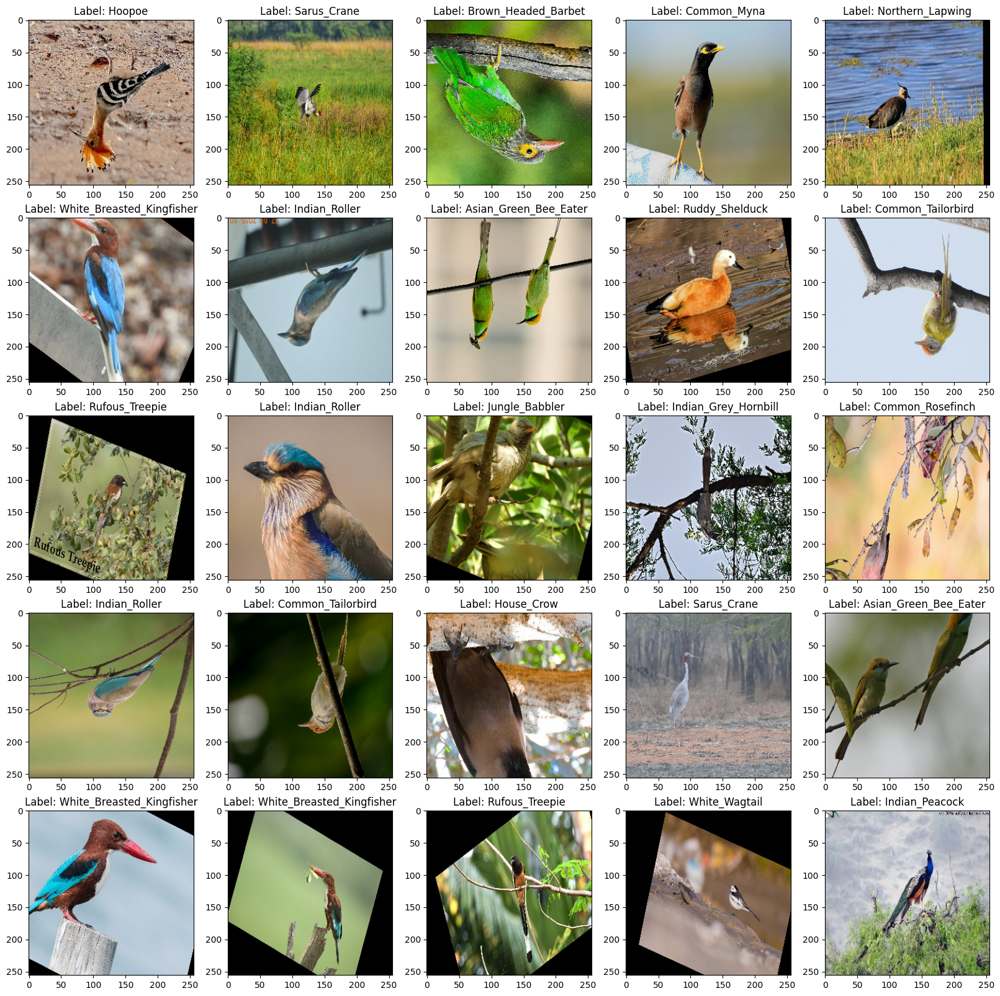

In [13]:
def view_mulitiple_samples(df, sample_loader, count, color_map='rgb', fig_size=(14, 10)):
    rows = (count + 4) // 5
    idx = random.sample(df.index.to_list(), count)
    fig = plt.figure(figsize=fig_size)

    for column, _ in enumerate(idx):
        plt.subplot(rows, 5, column+1)
        plt.title(f'Label: {df.label[_]}')

        if color_map=='rgb':
            plt.imshow(sample_loader(df.image_path[_]))
        else:
            plt.imshow(tf.image.rgb_to_grayscale(sample_loader(df.image_path[_])), cmap=color_map)

    return

view_mulitiple_samples(
    train_df, _load,
    count=25, fig_size=(20, 20)
)


In [14]:
train_split_idx, val_split_idx, _, _ = train_test_split(train_df.index,
                                                        train_df.label_encoded,
                                                        test_size=0.2,
                                                        stratify=train_df.label_encoded,
                                                        random_state=CFG.SEED)

/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):


In [15]:
train_new_df = train_df.iloc[train_split_idx].reset_index(drop=True)
val_df = train_df.iloc[val_split_idx].reset_index(drop=True)

In [16]:
train_size = len(train_new_df)
val_size = len(val_df)
test_size = len(test_df)
total = train_size + val_size + test_size

print(f'train samples count:\t\t{train_size}\t({(100 * train_size/total):.2f}%)')
print(f'validation samples count:\t{val_size}\t({(100 * val_size/total):.2f}%)')
print(f'TOTAL:\t\t\t\t{total}\t({(100 * total/total):.2f}%)')

train samples count:		24000	(64.00%)
validation samples count:	6000	(16.00%)
TOTAL:				37500	(100.00%)


/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector)

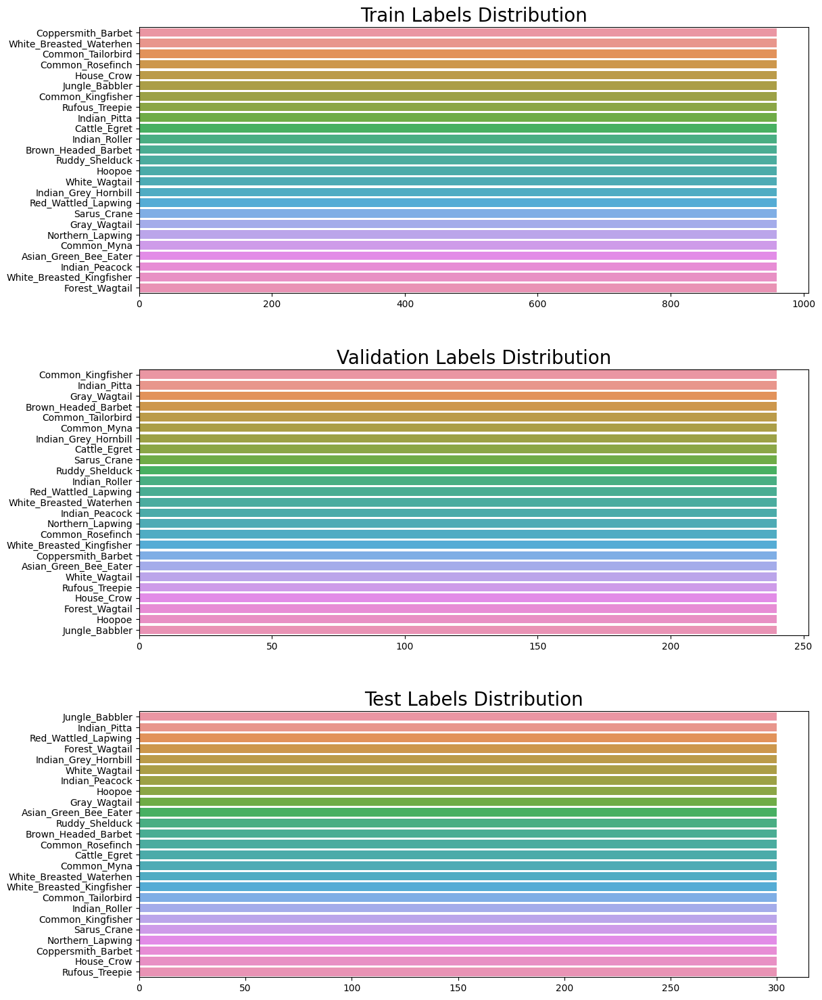

In [17]:
fig, (ax1, ax2, ax3) = plt.subplots(3, figsize=(12, 16))
fig.tight_layout(pad=6.0)

ax1.set_title('Train Labels Distribution', fontsize=20)
train_distribution = train_new_df['label'].value_counts().sort_values()
sns.barplot(x=train_distribution.values,
            y=list(train_distribution.keys()),
            orient="h",
            ax=ax1);

ax2.set_title('Validation Labels Distribution', fontsize=20)
val_distribution = val_df['label'].value_counts().sort_values()
sns.barplot(x=val_distribution.values,
            y=list(val_distribution.keys()),
            orient="h",
            ax=ax2);

ax3.set_title('Test Labels Distribution', fontsize=20)
test_distribution = test_df['label'].value_counts().sort_values()
sns.barplot(x=test_distribution.values,
            y=list(test_distribution.keys()),
            orient="h",
            ax=ax3);

In [18]:
augmentation_layer = Sequential([
    layers.RandomFlip(mode='horizontal_and_vertical', seed=CFG.TF_SEED),
    layers.RandomZoom(height_factor=(-0.1, 0.1), width_factor=(-0.1, 0.1), seed=CFG.TF_SEED),
    layers.RandomContrast(factor=0.1, seed=CFG.TF_SEED),
], name='augmentation_layer')

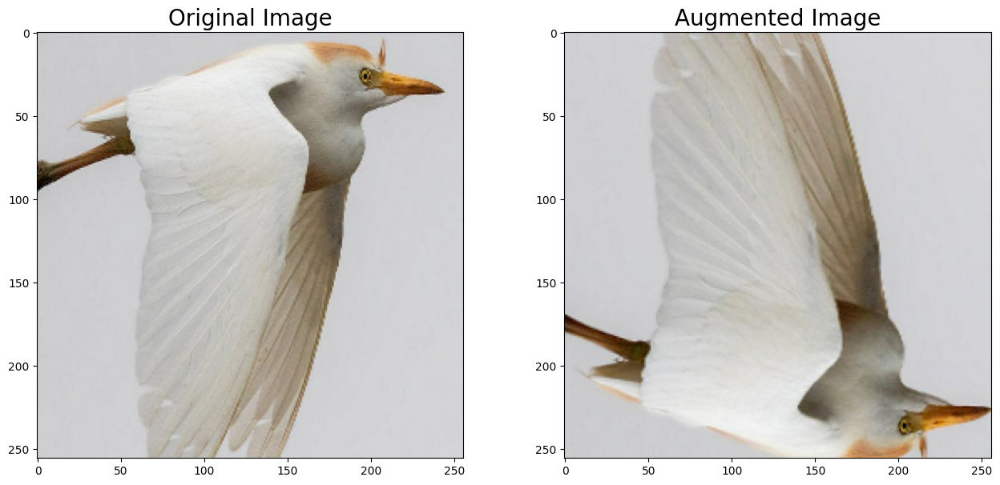

In [19]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 10))
fig.tight_layout(pad=6.0)

ax1.set_title('Original Image', fontsize=20)
ax1.imshow(sample_image)

ax2.set_title('Augmented Image', fontsize=20)
ax2.imshow(augmentation_layer(sample_image))

In [20]:
def encode_labels(labels, encode_depth=25):
    return tf.one_hot(labels, depth=encode_depth).numpy()

def create_pipeline(df, load_function, augment=False, batch_size=32, shuffle=False, cache=None, prefetch=False):
    image_paths = df.image_path
    image_labels = encode_labels(df.label_encoded)
    AUTOTUNE = tf.data.AUTOTUNE

    ds = tf.data.Dataset.from_tensor_slices((image_paths, image_labels))
    ds = ds.map(lambda x, y: (augmentation_layer(load_function(x)), y) if augment else (load_function(x), y), num_parallel_calls=AUTOTUNE)

    if shuffle:
        ds = ds.shuffle(buffer_size=1000)

    ds = ds.batch(batch_size)

    if cache != None:
        ds = ds.cache(cache)

    if prefetch:
        ds = ds.prefetch(buffer_size=AUTOTUNE)

    return ds

In [21]:
train_ds = create_pipeline(train_new_df, _load, augment=True,
                           batch_size=CFG.BATCH_SIZE,
                           shuffle=False, prefetch=True)

val_ds = create_pipeline(val_df, _load,
                         batch_size=CFG.BATCH_SIZE,
                         shuffle=False, prefetch=False)

test_ds = create_pipeline(test_df, _load,
                          batch_size=CFG.BATCH_SIZE,
                          shuffle=False, prefetch=False)

In [22]:
print('Train Input Data Pipeline:\n\n', train_ds)
print('Validation Input Data Pipeline:\n\n', val_ds)
print('Test Input Data Pipeline:\n\n', test_ds)

Train Input Data Pipeline:

 <_PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 25), dtype=tf.float32, name=None))>
Validation Input Data Pipeline:

 <_BatchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 25), dtype=tf.float32, name=None))>
Test Input Data Pipeline:

 <_BatchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 25), dtype=tf.float32, name=None))>


In [23]:
def get_tfhub_model(model_link, model_name, model_trainable=False):
    return hub.KerasLayer(model_link,
                          trainable=model_trainable,
                          name=model_name)

In [24]:
efficientnet_v2_url = 'https://tfhub.dev/google/imagenet/efficientnet_v2_imagenet21k_b3/feature_vector/2'
model_name = 'efficientnet_v2_b3'

set_trainable=False

efficientnet_v2_b3 = get_tfhub_model(efficientnet_v2_url, model_name,
                                     model_trainable=set_trainable)

In [25]:
def efficientnet_v2_model():
    initializer = tf.keras.initializers.GlorotNormal(seed=CFG.SEED)

    return Sequential([
        layers.Input(shape=CFG.IMAGE_SIZE, dtype=tf.float32, name='input_image'),
        efficientnet_v2_b3,
        layers.Dropout(0.2),
        layers.Dense(512, activation='relu', kernel_initializer=initializer),
        layers.Dense(512, activation='relu', kernel_initializer=initializer),
        layers.Dense(512, activation='relu', kernel_initializer=initializer),
        layers.Dense(256, activation='relu', kernel_initializer=initializer),
        layers.Dense(25, dtype=tf.float32, activation='softmax', kernel_initializer=initializer)
    ], name='efficientnet_v2_sequential_model')

In [26]:
model_efficientnet_v2 = efficientnet_v2_model()

model_efficientnet_v2.summary()

Model: "efficientnet_v2_sequential_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnet_v2_b3 (KerasL  (None, 1536)              12930622  
 ayer)                                                           
                                                                 
 dropout (Dropout)           (None, 1536)              0         
                                                                 
 dense (Dense)               (None, 512)               786944    
                                                                 
 dense_1 (Dense)             (None, 512)               262656    
                                                                 
 dense_2 (Dense)             (None, 512)               262656    
                                                                 
 dense_3 (Dense)             (None, 256)               131328    
                                  

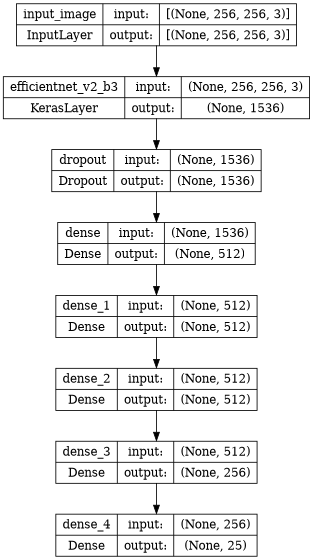

In [27]:
plot_model(
    model_efficientnet_v2, dpi=60,
    show_shapes=True
)

In [28]:
def train_model(model, num_epochs, callbacks_list, tf_train_data, tf_valid_data=None, shuffling=False):
    model_history = model.fit(tf_train_data, epochs=num_epochs, validation_data=tf_valid_data,
                              validation_steps=len(tf_valid_data) if tf_valid_data else None,
                              callbacks=callbacks_list, shuffle=shuffling)

    return model_history

In [29]:
early_stopping_callback = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=3,
    restore_best_weights=True)

reduce_lr_callback = tf.keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    patience=2,
    factor=0.1,
    verbose=1)

CALLBACKS = [early_stopping_callback, reduce_lr_callback]
METRICS = ['accuracy']

In [30]:
tf.random.set_seed(CFG.SEED)

model_efficientnet_v2.compile(
    loss=tf.keras.losses.CategoricalCrossentropy(),
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    metrics=METRICS
)

print(f'Training {model_efficientnet_v2.name}.')
print(f'Train on {len(train_df)} samples, validate on {len(val_df)} samples.')
print('----------------------------------')

efficientnet_v2_history = train_model(
    model_efficientnet_v2, CFG.EPOCHS, CALLBACKS,
    train_ds, val_ds,
    shuffling=False
)

Training efficientnet_v2_sequential_model.
Train on 30000 samples, validate on 6000 samples.
----------------------------------
Epoch 1/10
750/750 [==============================] - 273s 339ms/step - loss: 0.4141 - accuracy: 0.8780 - val_loss: 0.1979 - val_accuracy: 0.9452 - lr: 0.0010
Epoch 2/10
750/750 [==============================] - 235s 313ms/step - loss: 0.2249 - accuracy: 0.9348 - val_loss: 0.1381 - val_accuracy: 0.9593 - lr: 0.0010
Epoch 3/10
750/750 [==============================] - 234s 312ms/step - loss: 0.1901 - accuracy: 0.9450 - val_loss: 0.1852 - val_accuracy: 0.9502 - lr: 0.0010
Epoch 4/10
750/750 [==============================] - 233s 310ms/step - loss: 0.1792 - accuracy: 0.9505 - val_loss: 0.1144 - val_accuracy: 0.9703 - lr: 0.0010
Epoch 5/10
750/750 [==============================] - 231s 308ms/step - loss: 0.1580 - accuracy: 0.9546 - val_loss: 0.1251 - val_accuracy: 0.9693 - lr: 0.0010
Epoch 6/10
750/750 [==============================] - ETA: 0s - loss: 0.1400 

In [31]:
efficientnet_v2_evaluation = model_efficientnet_v2.evaluate(test_ds)

235/235 [==============================] - 44s 185ms/step - loss: 0.0838 - accuracy: 0.9804


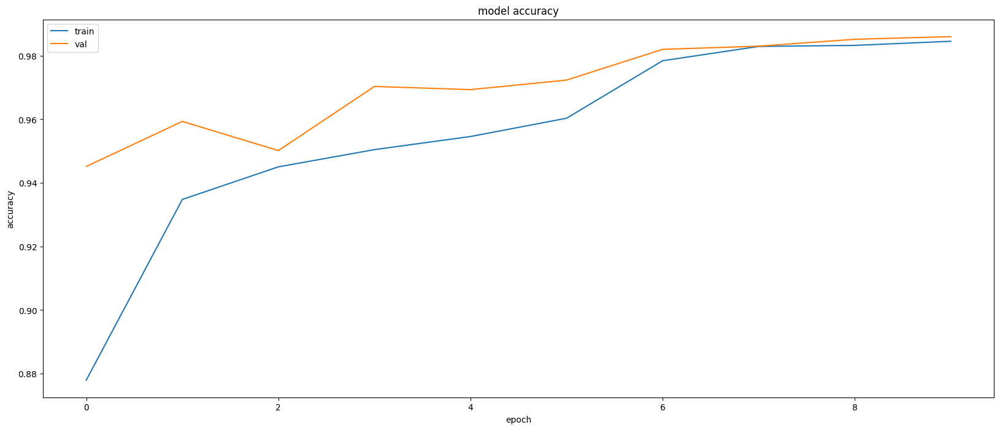

In [32]:
plt.figure(figsize=(20,8))
plt.plot(efficientnet_v2_history.history['accuracy'])
plt.plot(efficientnet_v2_history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

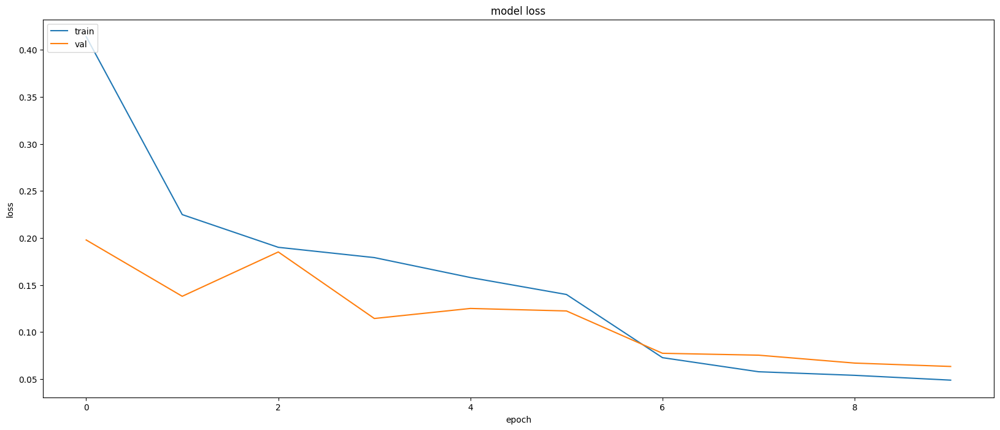

In [33]:
plt.figure(figsize=(20,8))
plt.plot(efficientnet_v2_history.history['loss'])
plt.plot(efficientnet_v2_history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [34]:
test_images_dt = []
for image_path in test_df.image_path:
     image = _load(image_path)
     test_images_dt.append(image)
test_images_dt = np.array(test_images_dt)

In [35]:
efficientnet_v2_test_probabilities = model_efficientnet_v2.predict(test_ds, verbose=1)
efficientnet_v2_test_predictions = tf.argmax(efficientnet_v2_test_probabilities, axis=1)

235/235 [==============================] - 40s 164ms/step


In [36]:
print(efficientnet_v2_test_predictions)

predictions_np = efficientnet_v2_test_predictions.numpy()
print(predictions_np)

tf.Tensor([16 19  1 ... 13  3 17], shape=(7500,), dtype=int64)
[16 19  1 ... 13  3 17]


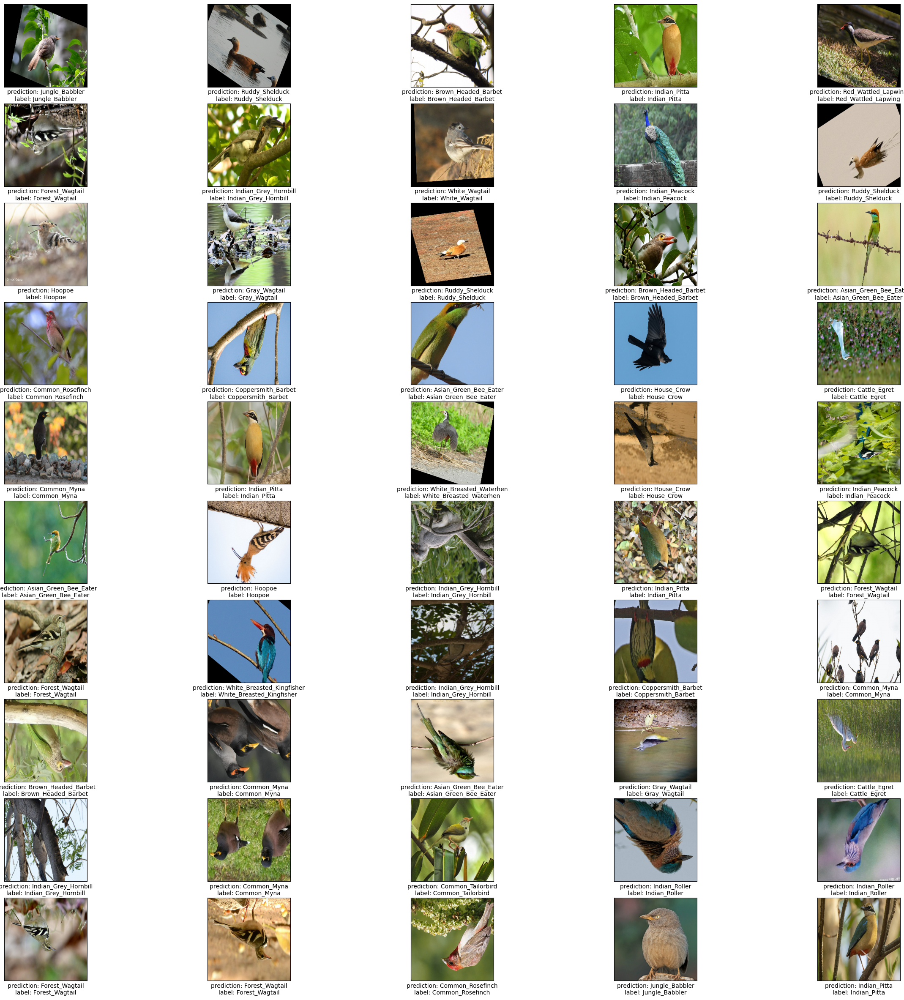

In [37]:
fig, axs = plt.subplots(10, 5, figsize=(30, 30))

for i, ax in enumerate(axs.flatten()):
    prediction_label = class_names[predictions_np[i]]
    true_label = class_names[test_df.label_encoded[i]]

    ax.set_xticks([])
    ax.set_yticks([])

    label_color = 'black' if prediction_label == true_label else 'red'
    ax.set_xlabel(f'prediction: {prediction_label}\nlabel: {true_label}', color=label_color)

    ax.imshow(test_images_dt[i])

plt.show()

In [38]:
def plot_training_curves(history):
    loss, val_loss = np.array(history.history['loss']), np.array(history.history['val_loss'])
    accuracy, val_accuracy = np.array(history.history['accuracy']), np.array(history.history['val_accuracy'])
    epochs = range(len(history.history['loss']))

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

    # Plot loss
    ax1.plot(epochs, loss, label='training_loss', marker='o')
    ax1.plot(epochs, val_loss, label='val_loss', marker='o')

    ax1.fill_between(epochs, loss, val_loss, where=(loss > val_loss), color='C0', alpha=0.3, interpolate=True)
    ax1.fill_between(epochs, loss, val_loss, where=(loss < val_loss), color='C1', alpha=0.3, interpolate=True)

    ax1.set_title('Loss (Lower Means Better)', fontsize=16)
    ax1.set_xlabel('Epochs', fontsize=12)
    ax1.legend()

    # Plot accuracy
    ax2.plot(epochs, accuracy, label='training_accuracy', marker='o')
    ax2.plot(epochs, val_accuracy, label='val_accuracy', marker='o')

    ax2.fill_between(epochs, accuracy, val_accuracy, where=(accuracy > val_accuracy), color='C0', alpha=0.3, interpolate=True)
    ax2.fill_between(epochs, accuracy, val_accuracy, where=(accuracy < val_accuracy), color='C1', alpha=0.3, interpolate=True)

    ax2.set_title('Accuracy (Higher Means Better)', fontsize=16)
    ax2.set_xlabel('Epochs', fontsize=12)
    ax2.legend();

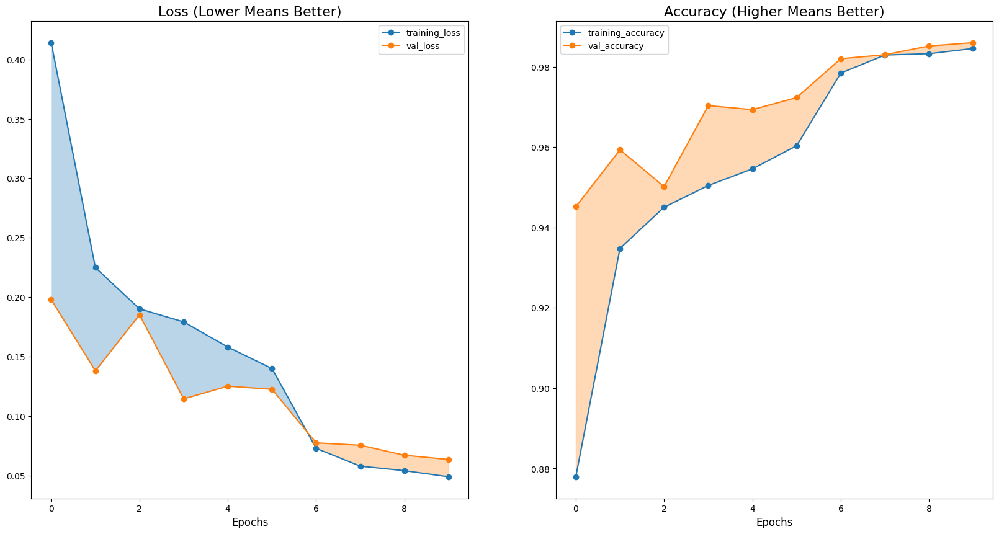

In [39]:
plot_training_curves(efficientnet_v2_history)

In [40]:
def plot_confusion_matrix(y_true, y_pred, classes='auto', figsize=(10, 10), text_size=12):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=figsize)

    sns.heatmap(
        cm, annot=True, cmap='Greens',
        annot_kws={"size": text_size}, fmt='g',
        linewidths=0.5, linecolor='black', clip_on=False,
        xticklabels=classes, yticklabels=classes
    ).set(title='Confusion Matrix', xlabel='Predicted Label', ylabel='True Label')

    plt.yticks(rotation=0)
    plt.show()

/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtyp

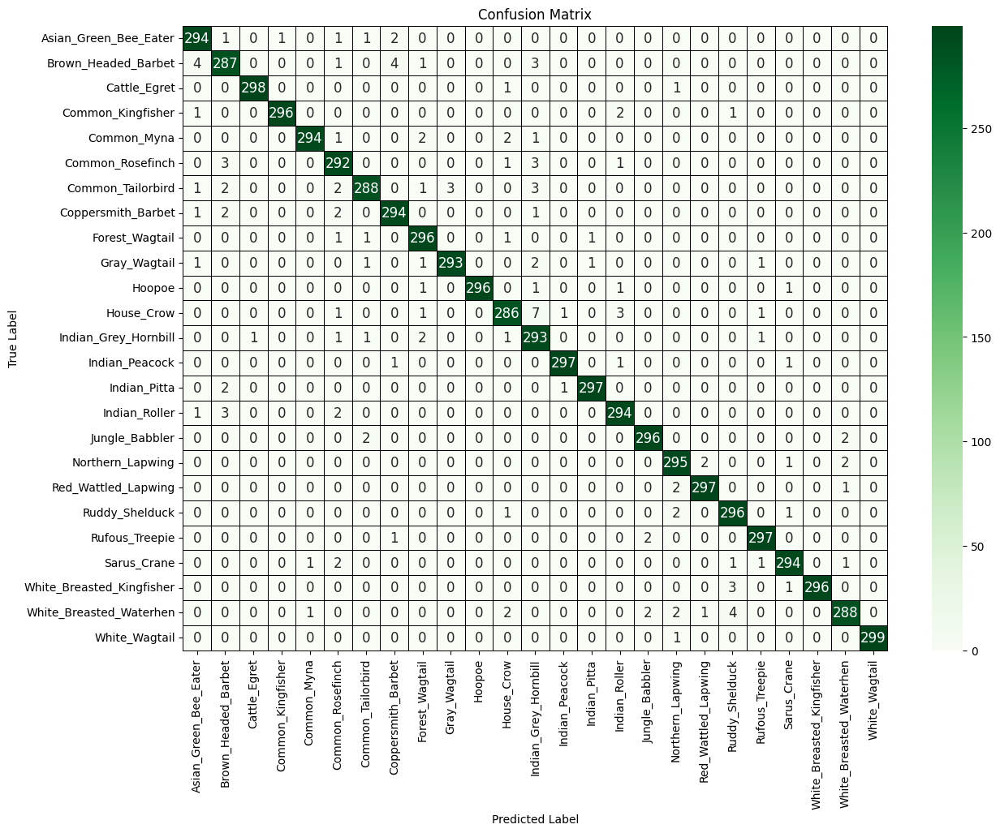

In [41]:
plot_confusion_matrix(
    test_df.label_encoded,
    efficientnet_v2_test_predictions,
    figsize=(14, 10),
    classes=class_names)

In [42]:
print(classification_report(test_df.label_encoded,
                            efficientnet_v2_test_predictions,
                            target_names=class_names))

                           precision    recall  f1-score   support

    Asian_Green_Bee_Eater       0.97      0.98      0.98       300
      Brown_Headed_Barbet       0.96      0.96      0.96       300
             Cattle_Egret       1.00      0.99      0.99       300
        Common_Kingfisher       1.00      0.99      0.99       300
              Common_Myna       0.99      0.98      0.99       300
         Common_Rosefinch       0.95      0.97      0.96       300
        Common_Tailorbird       0.98      0.96      0.97       300
       Coppersmith_Barbet       0.97      0.98      0.98       300
           Forest_Wagtail       0.97      0.99      0.98       300
             Gray_Wagtail       0.99      0.98      0.98       300
                   Hoopoe       1.00      0.99      0.99       300
               House_Crow       0.97      0.95      0.96       300
     Indian_Grey_Hornbill       0.93      0.98      0.95       300
           Indian_Peacock       0.99      0.99      0.99     

/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:605: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
/opt/conda/lib/python3.10/site-packages/sklearn/utils/validation.py:614: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtyp

In [43]:
from keras.models import load_model

model_efficientnet_v2.save('my_model.h5')

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [44]:
# from keras.models import load_model

# loaded_model = load_model('my_model.h5')